# DS4HB TUTORIAL

## 1. Intro

### Tasks
Given a list of TBI mice, makes a brain mask and a ROI mask prediction with the given loaded models

*   Get aquainted with visualization of 3D data. Open other images / change the sampling frequency of point clouds
*   Load a standard 3D U-Net and make predictions on some test subjects
*   Load the 3DR-Net and make predictions on some test subjects
*   Assess testing performance and compare the above models. Visualize the estimated masks
*   Opt: Load the 3DR-Net trained with domain adaptation and visualize the estimated masks


## 2. Dataset

We'll use this public dataset: http://preprocessed-connectomes-project.org/NFB_skullstripped/


The dataset comprises information from 125 individuals aged between 21 and 45 years, encompassing a diverse range of clinical and subclinical psychiatric symptoms. Each participant's data includes:

- Anonymized (de-faced for privacy) Structural T1-weighted image
- Skull-stripped image
- Brain mask

The images are in NiFTI format (.nii.gz) with a resolution of 1 mm³.

### Context
**What is a T1-weighted image?**

A T1-weighted image is a type of magnetic resonance imaging (MRI) that highlights differences in tissue density, providing detailed anatomical information. It is particularly useful for visualizing brain structures since it provides crisp images, and shows fluids as dark.

**What is a Nifti format?**

NIfTI (Neuroimaging Informatics Technology Initiative) is a data format for the storage of Functional Magnetic Resonance Imaging (fMRI) and other medical images.

## 3. Libraries

In [1]:
# utils
from utils.utils import save_excel_table
from utils.nifti import estimate_volume

# visualization
from utils.vedo import plot_slicer_cloud, plot_volume_cloud

# neural imaging
# !pip install nilearn
import nilearn
import nibabel as nib

# tensorflow
import tensorflow as tf
from training.metrics import *

# other
import os
import importlib
import numpy as np

# make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

# print the version of tensorflow
print("Tensorflow version: ", tf.__version__)
print("Cuda version: ", tf.sysconfig.get_build_info()['cuda_version'])

Num GPUs Available:  0
Tensorflow version:  2.10.0
Cuda version:  64_112


### Download and extract the dataset

In [2]:
dataset_folder = './dataset'

# Check if the folder already exists
if not os.path.exists(dataset_folder):
    # Step 1: Download the dataset
    !curl -O https://fcp-indi.s3.amazonaws.com/data/Projects/RocklandSample/NFBS_Dataset.tar.gz

    # Step 2: Extract the dataset
    !tar -xf NFBS_Dataset.tar.gz

    # Optionally, you can remove the tar file after extracting to save space
    !rm NFBS_Dataset.tar.gz
else:
    print(f"The folder '{dataset_folder}' already exists. Skipping download and extraction.")


The folder './dataset' already exists. Skipping download and extraction.


In [3]:
items = os.listdir(dataset_folder)

patients = [item for item in items if os.path.isdir(os.path.join(dataset_folder, item))]
num_patients = len(patients)

print("Number of patients (folders):", num_patients)

Number of patients (folders): 4


## 4. Data exploration

We can load our NIfTI files using the **nibabel** library and utilize the **nilearn** library to process the MRIs and visualize them

In [4]:
sample_filename = dataset_folder + '/T1w-C52-FLASH/Isch_PAL_PPIAKO_1767/Anat/Isch_PAL_PPIAKO_1767_N4.nii.gz'
sample_filename_brain_mask = dataset_folder +'/T1w-C52-FLASH/Isch_PAL_PPIAKO_1767/Anat/Isch_PAL_PPIAKO_1767_brain_mask.nii.gz'
sample_filename_roi_mask = dataset_folder +'/T1w-C52-FLASH/Isch_PAL_PPIAKO_1767/Anat/Isch_PAL_PPIAKO_1767_Labels.nii.gz'

sample_img = nib.load(sample_filename).get_fdata()
sample_brain_mask = nib.load(sample_filename_brain_mask).get_fdata()
sample_roi_mask = nib.load(sample_filename_roi_mask).get_fdata()

input_shape = sample_img.shape
brain_mask_shape = sample_brain_mask.shape
roi_mask_shape = sample_roi_mask.shape

print("img shape ->", input_shape)
print("brain mask shape ->", brain_mask_shape)
print("roi mask shape ->", roi_mask_shape)

img shape -> (80, 300, 110)
brain mask shape -> (80, 300, 110)
roi mask shape -> (80, 300, 110)


### 2D slices view

In [5]:
from nilearn.plotting import view_img, plot_glass_brain, plot_anat, plot_epi
from nilearn.image import load_img
nilearn_img = load_img(sample_filename)
nilearn_brain_mask = load_img(sample_filename_brain_mask)
nilearn_roi_mask = load_img(sample_filename_roi_mask)

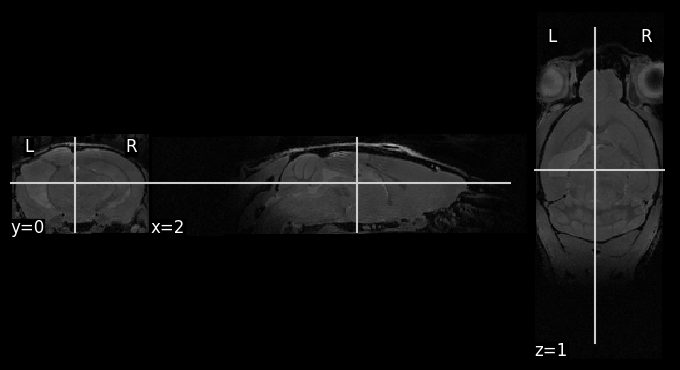

In [6]:
plot_anat(nilearn_img)

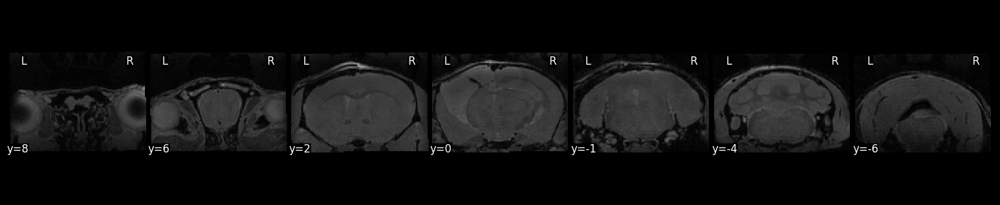

In [7]:
plot_anat(nilearn_img, draw_cross=False, display_mode='y')

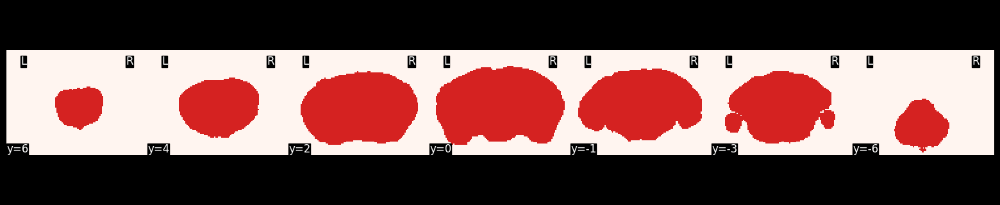

In [8]:
plot_anat(nilearn_brain_mask, draw_cross=False, display_mode='y', cmap='Reds')

C:\Users\marcello.desalvo\AppData\Local\Temp\ipykernel_25252\1964646675.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('rainbow', 256)


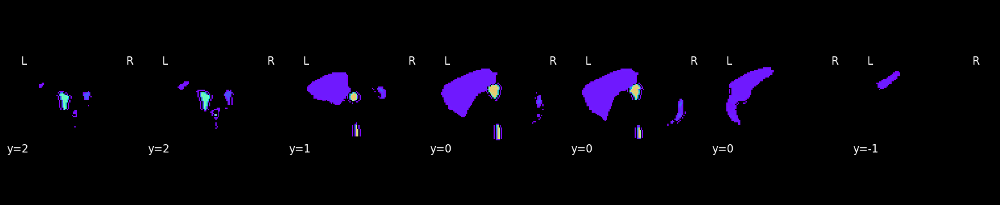

In [9]:
# Make a custom cmap with 0 set as transparent and other integer values as random colors
from matplotlib import cm
from matplotlib.colors import Normalize
import matplotlib.pyplot as plt
import random
from matplotlib.colors import ListedColormap

# Select ranibow colors for the colormap
cmap = cm.get_cmap('rainbow', 256)
# Create a new colormap with 0 set as transparent
colors = cmap(np.arange(cmap.N))
colors[0, -1] = 0  # Set alpha to 0 for the first color (0 value)
cmap = ListedColormap(colors)

plot_anat(nilearn_roi_mask, draw_cross=False, display_mode='y', cmap=cmap)

c:\Users\marcello.desalvo\AppData\Local\miniconda3\envs\rnet\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\marcello.desalvo\AppData\Local\miniconda3\envs\rnet\lib\site-packages\nilearn\image\resampling.py:493: UserWarning: The provided image has no sform in its header. Please check the provided file. Results may not be as expected.
  warnings.warn(
c:\Users\marcello.desalvo\AppData\Local\miniconda3\envs\rnet\lib\site-packages\nilearn\image\resampling.py:291: UserWarning: Resampling binary images with continuous or linear interpolation. This might lead to unexpected results. You might consider using nearest interpolation instead.
  warnings.warn(



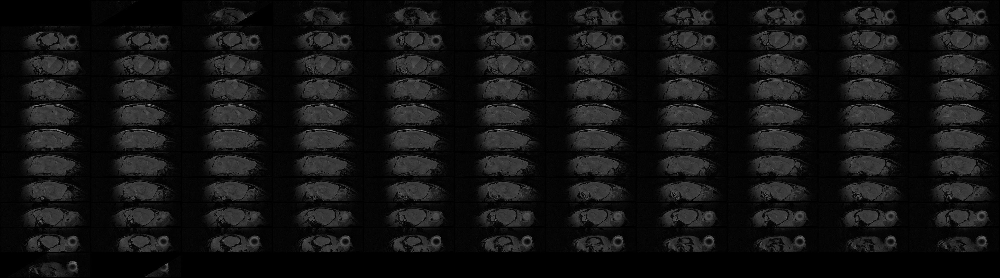
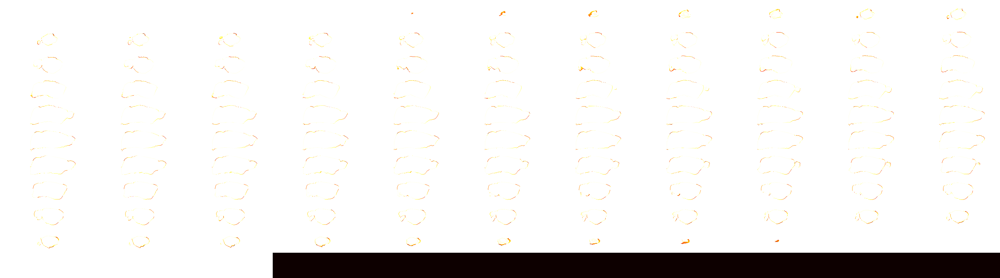

In [10]:
view_img(nilearn_brain_mask, nilearn_img)

c:\Users\marcello.desalvo\AppData\Local\miniconda3\envs\rnet\lib\site-packages\numpy\core\fromnumeric.py:771: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)
c:\Users\marcello.desalvo\AppData\Local\miniconda3\envs\rnet\lib\site-packages\nilearn\image\resampling.py:493: UserWarning: The provided image has no sform in its header. Please check the provided file. Results may not be as expected.
  warnings.warn(



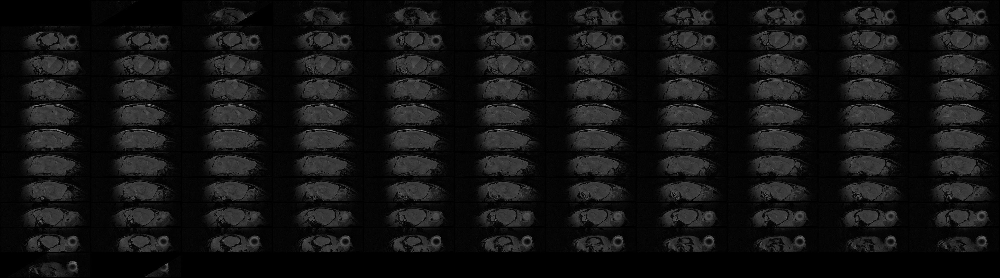
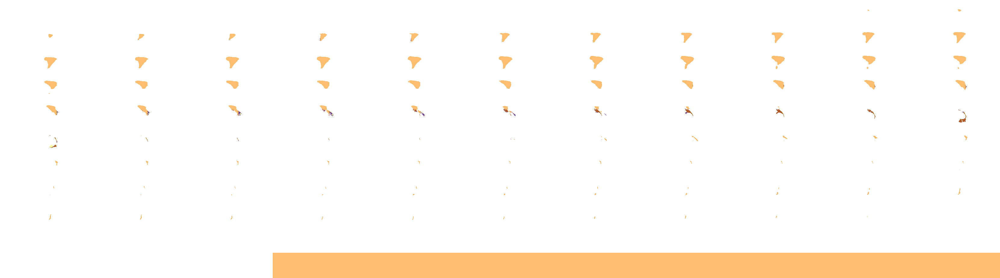

In [11]:
view_img(nilearn_roi_mask, nilearn_img, cmap='Paired')

### 3D Pointcloud view

In [12]:
import importlib
import utils.visualization as visualization
importlib.reload(visualization)
from utils.visualization import plot_3d_overlap
plot_3d_overlap(sample_img, sample_brain_mask, brain_density=30000, mask_density=30000)

In [13]:
plot_3d_overlap(sample_brain_mask, sample_roi_mask, brain_density=40000, mask_density=10000, cmap='rainbow')

## 5. Load a multi-task 3D U-Net

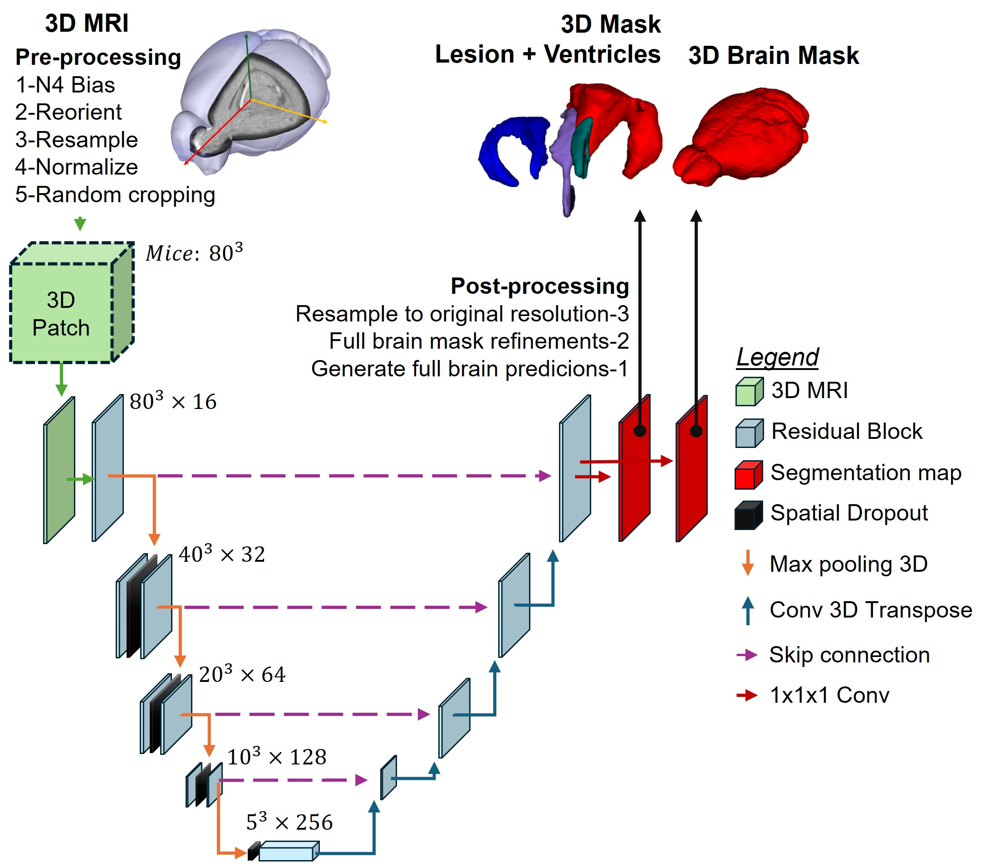

### Load the model
Load a previously trained model to start making predictions

In [14]:
import models.networks
from training.metrics import *
from training.losses import *

model_path = './models/multi_task_3d_Unet.h5'
model = tf.keras.models.load_model(model_path,
                                   custom_objects={ "loss": diceCELoss(),
                                                    "precision": precision_coefficient(),
                                                    "sensitivity": sensitivity_coefficient(),
                                                    "specificity": specificity_coefficient(),
                                                    "K": tf.keras.backend,
                                                    "training": False,
                                                  }, compile=False)

model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 80, 80, 80,  0           []                               
                                 1)]                                                              
                                                                                                  
 conv3d_74 (Conv3D)             (None, 80, 80, 80,   448         ['input_3[0][0]']                
                                16)                                                               
                                                                                                  
 batch_normalization_54 (BatchN  (None, 80, 80, 80,   64         ['conv3d_74[0][0]']              
 ormalization)                  16)                                                         

### Configuration

In [15]:
# Folder structure for structured mode
modalities_directories = {
    'FLASH': 'Anat'
}

# Output labels ( Network -> Output mask labels)
labels_mapping = {
     0: 0,
     1: 1,
     2: 3,
     3: 21
 }

postprocessed_mapping = {
    0: 0,
    1: 1,
    2: 3,
    3: 13,
    4: 21
}

name_mapping = {
    0: {'name': 'Background', 'value': 0},
    1: {'name': 'Lesion', 'value': 1},
    2: {'name': 'Contra Ventricle', 'value': 3},
    3: {'name': 'Ipsi Ventricle', 'value': 13},
    4: {'name': 'Third Ventricle', 'value': 21}
}

num_classes = len(labels_mapping)

### Prediction parameters
- patch_size (tuple): size of the sliding window used to extract patches from the image
- patch_resolution (tuple): desired target resolution for all patch (should be equal to the training resolution of the model)
- stride (int): translation offset of the sliding window (less is better but requires more computational time)

Suggested stride values: 10 (very slow but most accurate), 20 (fast and accurate), 40 (very fast but less accurate)

In [16]:
patch_size = (80,80,80) #voxels
patch_resolution = (0.1,0.1,0.1) #mm
stride = 20
threshold = 0.5

### Preprocessing configuration
The standard pipeline order is:
1. (opt.) Correct x10 scale
2. Apply N4 Bias Field correction
3. Copy the orientation from the ref. image
4. Resample to a target resolution
5. Normalize the intensity values with z-score (default)

In [17]:
from preprocessing.preprocessor import Preprocessor, Resample, Reorient, Normalize, CorrectX10, N4BiasFieldCorrection

# ref image for reorientation
ref_img = nib.load(os.path.join('./dataset', 'Reference', 'TBI_fm_19_49', 'Anat', 'TBI_fm_19_49_N4.nii.gz'))

# Create an instance of the MRIProcessor class
processor = Preprocessor([
    CorrectX10(),
    N4BiasFieldCorrection(),
    Reorient(ref_img),
    Resample(target_resolution=patch_resolution, interpolation=0),
    Normalize()
])

### Postprocessing


Makes the predictions by sliding through the input a patch volume of size (nx,ny,nz) with a stride of size s

In [18]:
from postprocessing.inference import RandomCroppingPrediction

# Create an instance of the RandomCroppingPrediction class
predictor = RandomCroppingPrediction(model, patch_size=patch_size, stride=stride, threshold=threshold, num_classes=num_classes)

Morphological smoothing:
- remove_small_objects (boolean): if true, removes small unconnected regions based on object_min_area
- object_min_area (int): the smallest allowable contiguos region size, in voxels
- fill_small_holes (boolean): if true, fills small holes
- holes_max_area (int): the maximum area, in voxels, of a contiguous hole that will be filled

In [19]:
remove_small_objects = True
object_min_area = 30000
fill_small_holes = True
holes_max_area = 20000

### Prediction

In [20]:
from postprocessing.refinement import ipsi_contra_division_callback, morphology_refinement_callback
import matplotlib.pyplot as plt

subject_id_mapping = {
    1: ('T1w-C52-FLASH', 'Isch_PAL_PPIAKO_1767'),
    2: ('T2w-C52-RARE', 'TBI_fm_19_50'),
}

# create cmap based on the color_map dictionary
cmap = 'nipy_spectral'

def generate_diff_mask(y_pred, gt, path=None):
    # Save a mask with only the voxels that are different between the prediction and the ground truth
    diff_mask = np.zeros_like(y_pred)
    diff_mask[y_pred != gt] = 1
    diff_mask = nib.Nifti1Image(diff_mask, affine=np.eye(4))

    if path is not None:
        nib.save(diff_mask, path)

    return diff_mask


def predict(subject_idx):    
    # Get the subject ID from the mapping
    if subject_idx not in subject_id_mapping:
        raise ValueError(f"Subject index {subject_idx} is not valid.")

    subject_modality = subject_id_mapping[subject_idx][0]
    subject_id = subject_id_mapping[subject_idx][1]
    subject_folder = os.path.join(dataset_folder, subject_modality, subject_id, 'Anat')
    file_path = os.path.join(subject_folder, subject_id + '_anat_orig.nii.gz')

    # load image
    nii_img = nib.load(file_path)
    x_prep = processor.preprocess(nii_img, path=file_path)

    # create a mask for this new unseen file
    results = predictor.random_cropping_inference(x_prep, with_brain_mask=True)
    y_mask = results['brain_mask']
    y_regions = results['roi']

    # postprocessing
    y_mask = morphology_refinement_callback(fill_small_holes=fill_small_holes, holes_max_area=holes_max_area,remove_small_objects=remove_small_objects, object_min_area=object_min_area)(y_mask)
    y_regions = ipsi_contra_division_callback(use_centroids=True)(y_regions)

    # save
    y_pred_nifti = nib.Nifti1Image(y_regions, affine=x_prep.affine, dtype=np.float64, header=x_prep.header)
    y_pred_mask_nifti = nib.Nifti1Image(y_mask, affine=x_prep.affine, dtype=np.float64, header=x_prep.header)


    # return to original shape and resolution
    predicted_roi_image = processor.deprocess(y_pred_nifti, nii_img, postprocessed_mapping, verbose=False)
    predicted_brainmask_image = processor.deprocess(y_pred_mask_nifti, nii_img, postprocessed_mapping, verbose=False)

    # print the volume of the predicted brain mask
    print('> Subject ID:', subject_id, "---------------------------")
    estimate_volume(predicted_roi_image, resolution=patch_resolution, verbose=True)
    print('\\-----------------------------------------------------')

    # Save diff mask by loading 'Labels.nii.gz' and comparing it with the prediction
    roi_gt = nib.load(os.path.join(subject_folder, subject_id + '_Labels.nii.gz'))
    brain_mask_gt = nib.load(os.path.join(subject_folder, subject_id + '_brain_mask.nii.gz'))
    diff_roi_mask = generate_diff_mask(predicted_roi_image.get_fdata(), roi_gt.get_fdata())
    diff_brain_mask = generate_diff_mask(predicted_roi_image.get_fdata(), brain_mask_gt.get_fdata())

    # Save all in a dictionary
    results = {
        'original_image': nii_img,
        'predicted_roi': predicted_roi_image,
        'predicted_brainmask': predicted_brainmask_image,
        'diff_roi_mask': diff_roi_mask,
        'diff_brain_mask': diff_brain_mask,
        'roi_gt': roi_gt,
        'brain_mask_gt': brain_mask_gt,
    }

    return results

In [29]:
# Example usage
subject_idx = 1

# Predict for the first subject
results = predict(subject_idx=subject_idx)
original = results['original_image']
predicted_roi_image = results['predicted_roi']
predicted_brainmask_image = results['predicted_brainmask']
roi_gt = results['roi_gt']
brain_mask_gt = results['brain_mask_gt']
diff_roi_mask = results['diff_roi_mask']
diff_brain_mask = results['diff_brain_mask']

> Subject ID: Isch_PAL_PPIAKO_1767 ---------------------------
Number of classes:  5

- Classes present in the mask:  [ 0.  1.  3. 13. 21.]
Class 0.0 has 2614485 voxels and a volume of 2614.4850000000006 mm^3
Class 1.0 has 22415 voxels and a volume of 22.415000000000003 mm^3
Class 3.0 has 1034 voxels and a volume of 1.0340000000000003 mm^3
Class 13.0 has 503 voxels and a volume of 0.5030000000000001 mm^3
Class 21.0 has 1563 voxels and a volume of 1.5630000000000004 mm^3
\-----------------------------------------------------


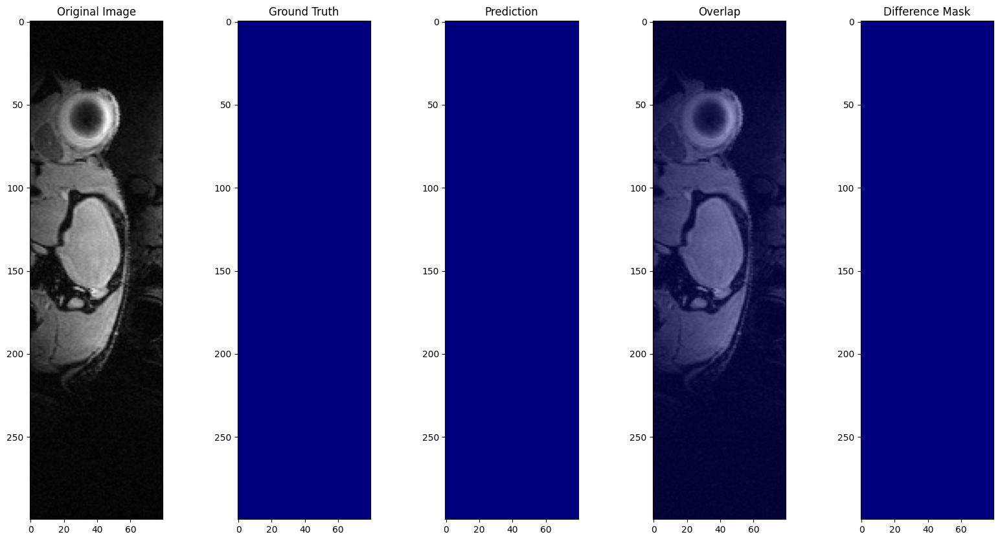

In [30]:
import importlib
import utils.visualization as visualization
importlib.reload(visualization)

from utils.visualization import plot_2d_slices, plot_3d_overlap
plot_3d_overlap(original.get_fdata(), predicted_brainmask_image.get_fdata(), brain_density=30000, mask_density=5000, cmap='rainbow', noise_treshold=0.3)
plot_2d_slices(original.get_fdata(), roi_gt.get_fdata(), predicted_roi_image.get_fdata(), diff_roi_mask.get_fdata(), slice_idx=10, alpha=0.4, axis=2)

## 6. Load the 3DR-Net
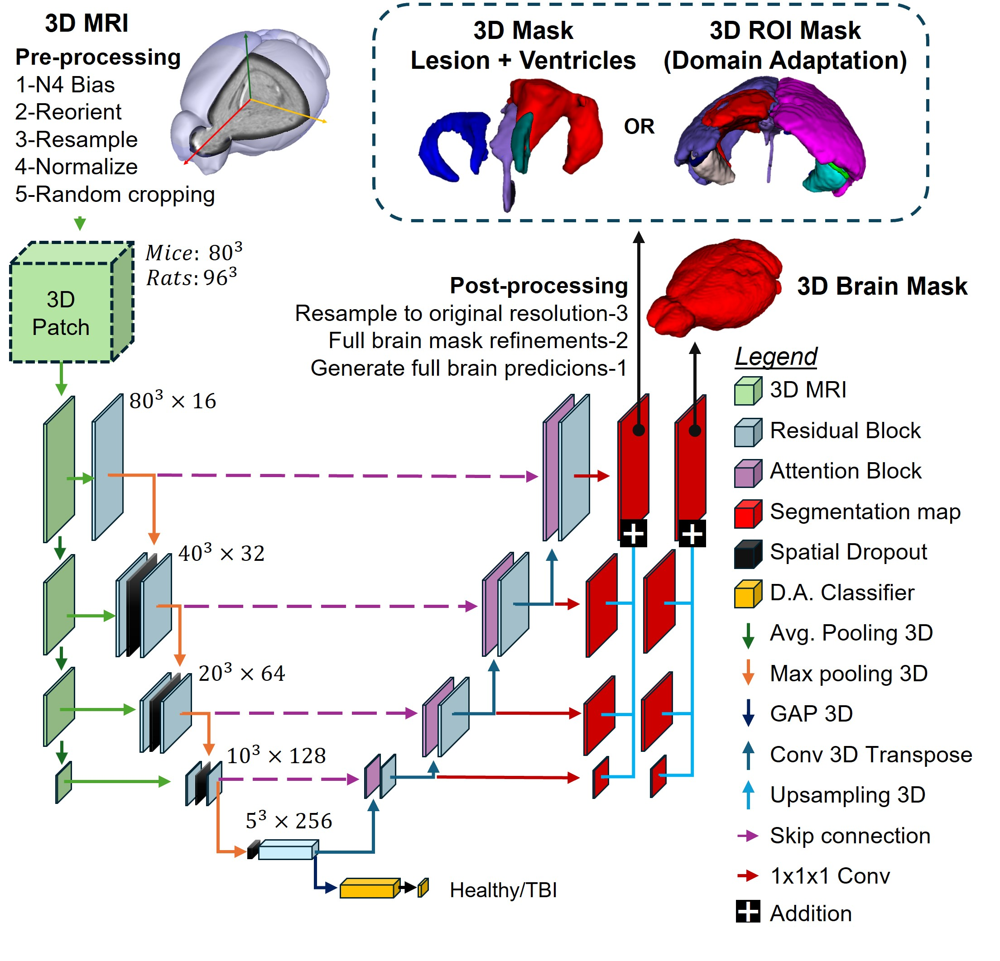